<a href="https://colab.research.google.com/github/ssyyjj1012/Humanoid/blob/master/Website_Screenshot_Detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 모델 다운로드

In [2]:
%cd /content
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

/content
fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
/content
fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [3]:
!ls data/images

bus.jpg  zidane.jpg


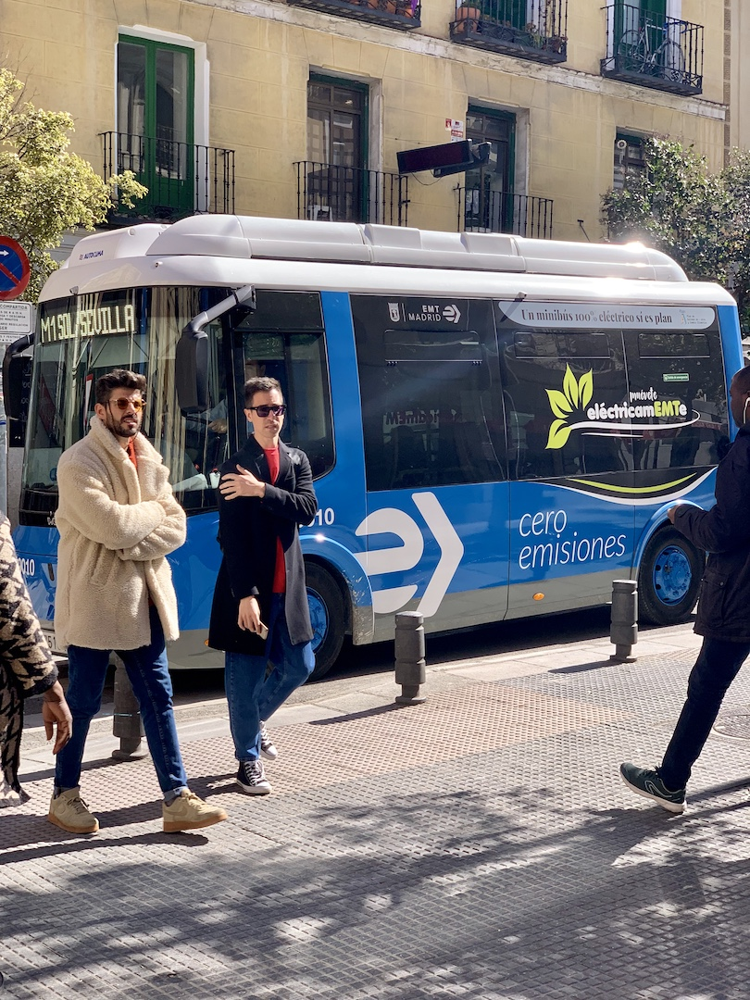

In [4]:
Image(filename = 'data/images/bus.jpg', width=500)

In [5]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/

detect: weights=['yolov5s.pt'], source=data/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 85.5ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, 84.1ms
Speed: 0.5ms pre-process, 84.8ms inference, 1.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp5


### 데이터셋 다운로드

https://public.roboflow.com/object-detection/website-screenshots/1

In [5]:
%mkdir /content/yolov5/website-screenshots
%cd /content/yolov5/website-screenshots

!curl -L "https://public.roboflow.com/ds/yP0hymGM0J?key=7heFwqY0tX" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

mkdir: cannot create directory ‘/content/yolov5/website-screenshots’: File exists
/content/yolov5/website-screenshots
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0   3600      0 --:--:-- --:--:-- --:--:--  3586
100  215M  100  215M    0     0   171M      0  0:00:01  0:00:01 --:--:--  302M
Archive:  roboflow.zip
replace README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace README.roboflow.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace data.yaml? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace test/images/addons_mozilla_org_png.rf.8pWFwr9ZblJ92BQghXBW.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace test/images/addons_mozilla_org_png.rf.ec9a8e78cd5c0e6ab255f50c408caecf.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace test/images/adf_ly_png.rf.490b629d732bbf70e8e1d3720f440c06.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n

In [6]:
from glob import glob

train_img_list = glob('/content/yolov5/website-screenshots/train/images/*.jpg')
test_img_list = glob('/content/yolov5/website-screenshots/test/images/*.jpg')
valid_img_list = glob('/content/yolov5/website-screenshots/valid/images/*.jpg')

print(len(train_img_list),len(test_img_list),len(valid_img_list))

1688 242 482


In [7]:
import yaml

with open('/content/yolov5/website-screenshots/train.txt','w') as f :
  f.write('\n'.join(train_img_list)+'\n')

with open('/content/yolov5/website-screenshots/test.txt','w') as f :
  f.write('\n'.join(test_img_list)+'\n')

with open('/content/yolov5/website-screenshots/valid.txt','w') as f :
  f.write('\n'.join(valid_img_list)+'\n')

In [8]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
  with open(line,'w') as f:
    f. write(cell.format(**globals()))

In [9]:
%cat /content/yolov5/website-screenshots/data.yaml


train: ./website-screenshots/train/images
test : ./website-screenshots/test/images
val: ./website-screenshots/valid/images

nc: 8
names: ['button', 'field', 'heading', 'iframe', 'image', 'label', 'link', 'text']

roboflow:
  workspace: roboflow-gw7yv
  project: website-screenshots
  version: 1
  license: MIT
  url: https://universe.roboflow.com/roboflow-gw7yv/website-screenshots/dataset/1


In [12]:
%%writetemplate /content/yolov5/website-screenshots/data.yaml

train: ./website-screenshots/train/images
test : ./website-screenshots/test/images
val: ./website-screenshots/valid/images

nc: 8
names: ['button', 'field', 'heading', 'iframe', 'image', 'label', 'link', 'text']

roboflow:
  workspace: roboflow-gw7yv
  project: website-screenshots
  version: 1
  license: MIT
  url: https://universe.roboflow.com/roboflow-gw7yv/website-screenshots/dataset/1

In [13]:
%cat /content/yolov5/website-screenshots/data.yaml


train: ./website-screenshots/train/images
test : ./website-screenshots/test/images
val: ./website-screenshots/valid/images

nc: 8
names: ['button', 'field', 'heading', 'iframe', 'image', 'label', 'link', 'text']

roboflow:
  workspace: roboflow-gw7yv
  project: website-screenshots
  version: 1
  license: MIT
  url: https://universe.roboflow.com/roboflow-gw7yv/website-screenshots/dataset/1


## 모델 구성

In [14]:
import yaml

with open("/content/yolov5/website-screenshots/data.yaml",'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [15]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes} # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [16]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 8 # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fal

In [17]:
%%time 
%cd /content/yolov5/
!python train.py --img 640 --batch 32 --epochs 100 --data ./website-screenshots/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name website_screenshot_results --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./website-screenshots/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=website_screenshot_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.

In [22]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 4764), started 0:57:54 ago. (Use '!kill 4764' to kill it.)

<IPython.core.display.Javascript object>

In [25]:
!ls /content/yolov5/runs/train/website_screenshot_results2/

confusion_matrix.png				    results.png
events.out.tfevents.1681370599.6a7f5942f80f.5075.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights


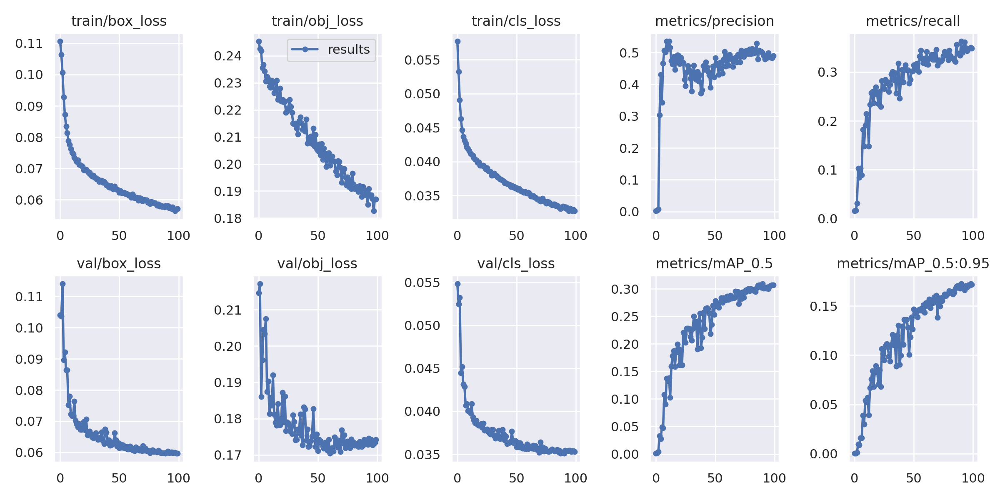

In [26]:
Image(filename='/content/yolov5/runs/train/website_screenshot_results2/results.png',width = 1000)

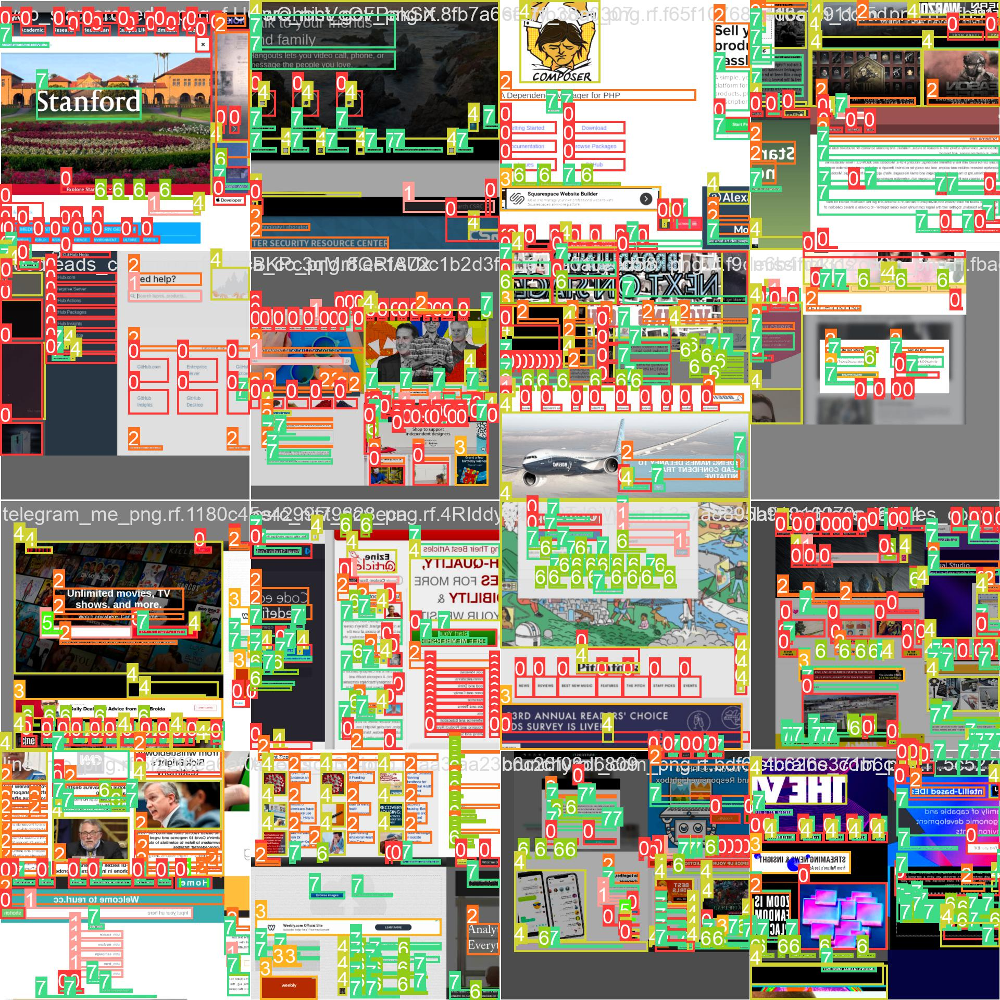

In [27]:
Image(filename='/content/yolov5/runs/train/website_screenshot_results2/train_batch0.jpg',width = 1000)

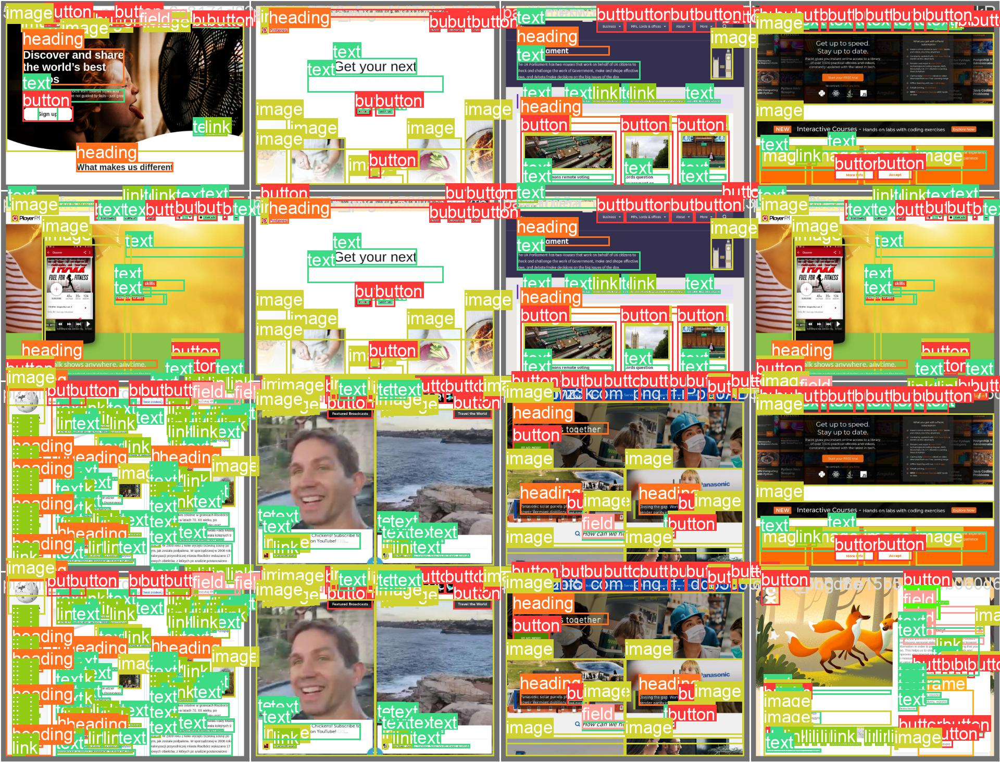

In [28]:
Image(filename='/content/yolov5/runs/train/website_screenshot_results2/val_batch0_labels.jpg',width = 1000)

In [29]:
!python val.py --weights runs/train/website_screenshot_results2/weights/best.pt --data ./website-screenshots/data.yaml --img 640 --iou 0.65 --half

val: data=./website-screenshots/data.yaml, weights=['runs/train/website_screenshot_results2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/website-screenshots/valid/labels.cache... 482 images, 0 backgrounds, 0 corrupt: 100% 482/482 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/yolov5/website-screenshots/valid/images/bandsintown_com_png.rf.I19VlDFncZ0RifJhmfEU.jpg: 4 duplicate labels removed
val: WARNING ⚠️ /content/yolov5/website-screenshots/valid/images/bandsintown_com_png.rf.b8462344187a5cdffe24d70019fabd0a.jp

In [30]:
%ls runs/train/website_screenshot_results2/weights

best.pt  last.pt


In [31]:
!python detect.py --weight runs/train/website_screenshot_results2/weights/best.pt --img 640 --conf 0.4 --source /content/yolov5/website-screenshots/test/images --save-txt

detect: weights=['runs/train/website_screenshot_results2/weights/best.pt'], source=/content/yolov5/website-screenshots/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/242 /content/yolov5/website-screenshots/test/images/addons_mozilla_org_png.rf.8pWFwr9ZblJ92BQghXBW.jpg: 480x640 7 buttons, 1 field, 2 headings, 3 images, 1 link, 5 texts, 81.2ms
image 2/242 /content/yolov5/website-screenshots/test/images/addons_mozilla_org_png.rf.ec9

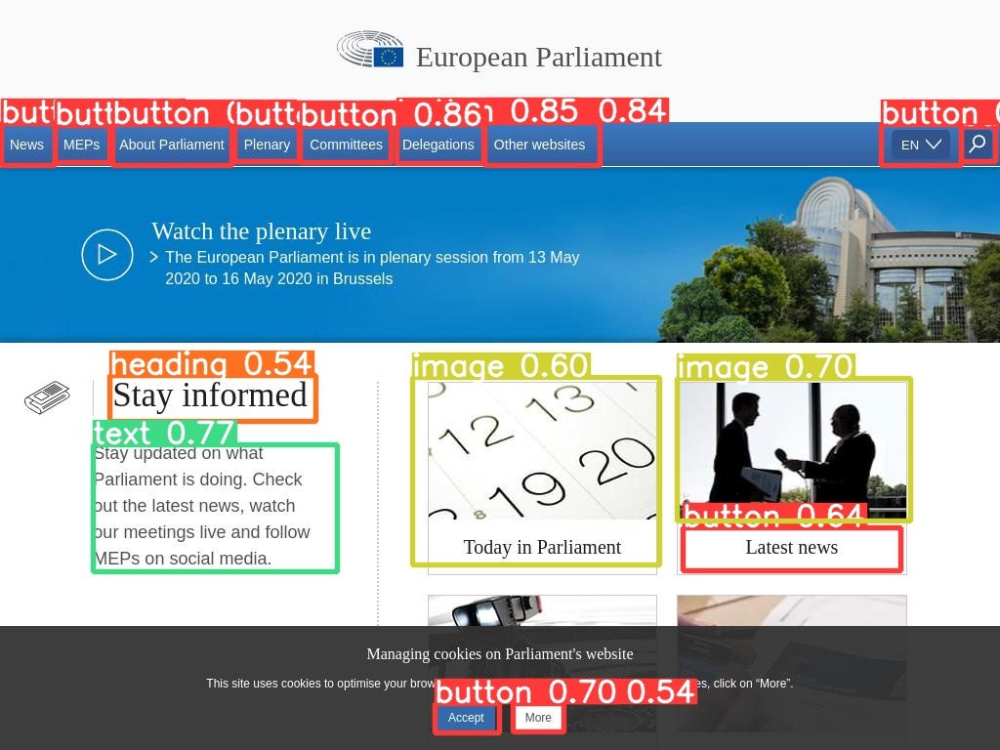

In [39]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp6/*.jpg'))
display(Image(filename = image_name))

In [42]:
!python detect.py --weight runs/train/website_screenshot_results2/weights/best.pt --img 2400 --conf 0.4 --save-txt --source /content/TEST

detect: weights=['runs/train/website_screenshot_results2/weights/best.pt'], source=/content/TEST, data=data/coco128.yaml, imgsz=[2400, 2400], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/7 /content/TEST/1.png: 2400x1120 1 button, 1 heading, 11 images, 82.4ms
image 2/7 /content/TEST/2.png: 2400x1120 2 headings, 1 image, 6.9ms
image 3/7 /content/TEST/3.png: 2400x1120 1 heading, 8 images, 6.9ms
image 4/7 /content/TEST/4.png: 2400x1120 1 heading, 4 images, 6.9ms
image 5/7 /content/TEST

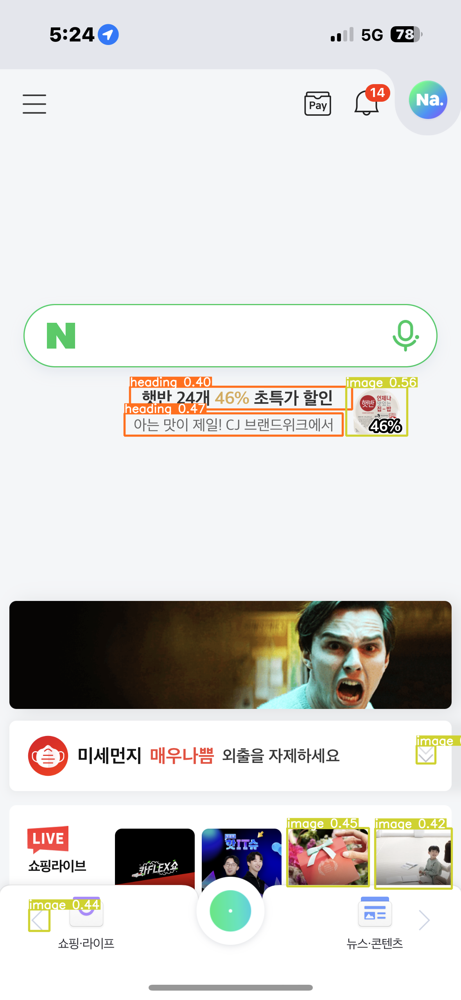

In [55]:
image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp9/*.png'))

display(Image(filename = image_name))

In [32]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [37]:
%cp /content/yolov5/runs/train/website_screenshot_results2/weights/best.pt /content/drive/MyDrive/website_screenshots